# Definition

In [4]:
%load_ext autoreload
%aimport libs.audio
%aimport libs.learning
%autoreload 1
# reload "audio.py,learning.py" before every execution. 
#reference : https://ipython.readthedocs.io/en/stable/config/extensions/autoreload.html?highlight=reload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
import librosa
import pyworld as pw
import scipy
import numpy as np
from pathlib import Path
from joblib import Parallel,delayed
from sklearn.preprocessing import normalize
import pickle
from IPython import embed
from tqdm import tqdm_notebook as tqdm
import IPython.display
import matplotlib.pyplot as plt
from datetime import datetime

import fastai as fastai
from fastai.vision import *
from fastai.vision.data import *
from fastai.vision.gan import *
from fastai.callbacks import *
from fastai.utils.mem import *
from fastai.callbacks.tensorboard import *
from torchvision.models import resnet18

from libs.audio import *
from libs.learning import *


In [7]:
model_ver = "006"

path=Path("D:/bulk/dataset/audio/Anonymous-VC")
path_raw =            path/"10_raw_yuduki-yukari"
path_prep_original  = path/"23_prep_original_3sec"
path_prep_anonymous = path/"33_prep_anonymous_3sec"
path_gen            = path/("43_gen_3sec_"+model_ver)
print(path)

path_prep_original.mkdir(parents=False, exist_ok=True)
path_prep_anonymous.mkdir(parents=False, exist_ok=True)
path_gen.mkdir(parents=False, exist_ok=True)

mtrace = GPUMemTrace()
tboard_path = Path('./runs')/model_ver


D:\bulk\dataset\audio\Anonymous-VC


In [8]:
# utility functions
def modelname(s:str):
    return f'{s}_{model_ver}_{datetime.now().strftime("%Y%m%d-%H%M%S")}'
def latest(starts_with:str,p:Path=path/'models'):
    'search the latest file match `starts_with` pattern in `p`,returns filename without extension.'
    pat='**/'+starts_with+'*'
    list_of_paths = p.glob(pat)
    ret = max(list_of_paths, key=lambda p: p.stat().st_ctime).stem
    print(f"""search latest file of : {pat}
     from {p}
    found:{ret}""")
    return ret



# preprocess

processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
processed ATR503_001.wav.pkl
original max/min:6.0/-6.0
original max/min:6.0/-6.0
original max/min:5.861549377441406/-5.999984264373779
original max/min:5.861549377441406/-5.999984264373779
processed ATR503_001.wav.pkl
specimage shape:(128, 768)


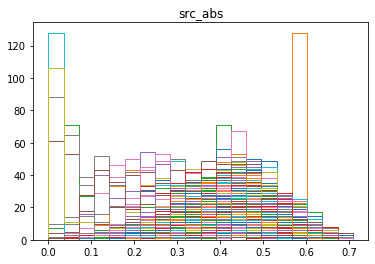

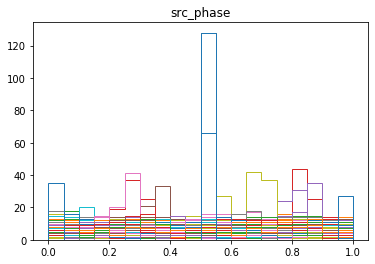

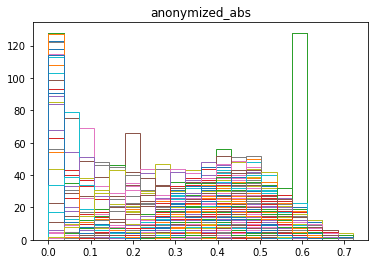

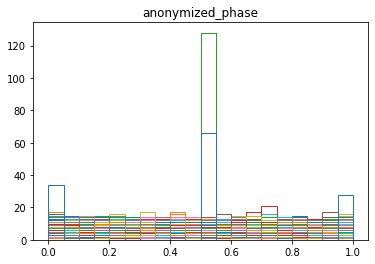

In [22]:
# try to preprocess 1 audio file, save png image, plot histogram.
# %%script false

p = list(path_raw.glob("**/*.wav"))[0]
sal,spl,aal,apl = preprocess_input(p,path_prep_original,path_prep_anonymous)
sa,sp,aa,ap = sal[0],spl[0],aal[0],apl[0]
print(f'specimage shape:{sa.shape}')

save_spectrogram_asImage(sa,sp,path_prep_original/(p.name+"_image.png"))
save_spectrogram_asImage(aa,ap,path_prep_anonymous/(p.name+"_image.png"))

hist(sa,'src_abs')
hist(sp,'src_phase')
hist(aa,'anonymized_abs')
hist(ap,'anonymized_phase')

display_audio(sa,sp)
display_audio(aa,ap)


In [7]:
Parallel(n_jobs=-1)( [delayed(preprocess_input)(p,path_prep_original,path_prep_anonymous) for p in tqdm(path_raw.glob("**/*.wav"))] )
print("done")


done


## check pickled prep_images

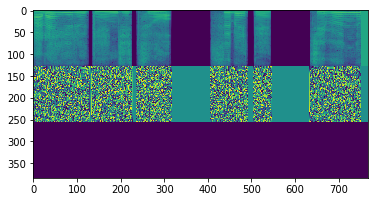

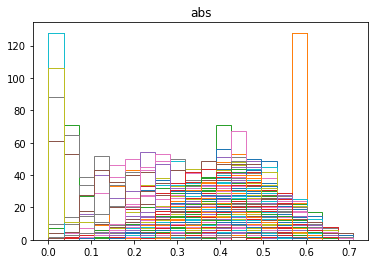

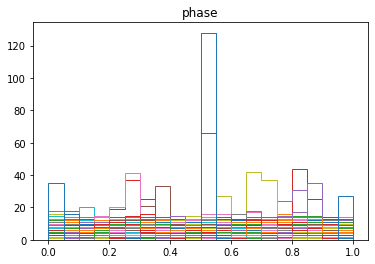

In [29]:
p = path_prep_original.ls()[0]
image = open_from_pickle(p)
plt.imshow(conc_specimage(image))
plt.show()
abs,phase = image_to_np(image)
display_audio(abs,phase)
hist(abs,title='abs',savepath=path_prep_original/(p.name+"_abs.png"))
hist(phase,title='phase',savepath=path_prep_original/(p.name+"_phase.png"))


# pre-train generator

In [5]:
def get_data(bs,x_path,y_path):
    src = PklImageImageList.from_folder(x_path,extensions=[".pkl"]) \
            .split_by_rand_pct(0.1, seed=42)
    data = (src.label_from_func(lambda x: y_path/x.name)) \
        .databunch(bs=bs,num_workers=0)
            # num_workers=0 is workaround for Broken Pipeline (Windows, Pytorch, 2019.8)
            # refer : https://forums.fast.ai/t/brokenpipeerror-using-jupyter-notebook-lesson-1/41090/4

#            .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
#             .normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [6]:
bs=2
# data_gen = get_data(bs,path_prep_original,path_prep_original)
data_gen = get_data(bs,path_prep_anonymous,path_prep_original)
data_gen.one_batch()[0].shape

torch.Size([2, 3, 128, 768])

In [7]:
%%script false
xy = data_gen.one_batch()
hist(xy[0][0][0],"x abs")  
hist(xy[0][0][1],"x phase") 
hist(xy[0][0][2],"x 3rd") 
hist(xy[1][0][0],"y abs")
hist(xy[1][0][1],"y phase")
hist(xy[1][0][2],"y 3rd") 

Couldn't find program: 'false'


In [8]:
arch = models.resnet18
wd = 1e-3
y_range = (0.,1.)
loss_gen = L1LossFlat()

In [9]:
class EpockImshower(LearnerCallback):
    def on_epoch_end(self, epoch: int, smooth_loss: Tensor, last_metrics: MetricsList, **kwargs: Any) -> bool:
        self.learn.show_results(rows=1,showtext=f"epoch{str(epoch)}")
    
def create_gen_learner():
#     return unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Weight,
#                          self_attention=True, y_range=y_range, loss_func=loss_gen)
    learner = unet_learner(data_gen, arch, wd=wd, blur=True, norm_type=NormType.Weight,
                         self_attention=True, y_range=None, loss_func=loss_gen)
    
    # UNET cannot show on Tensorboard.(SummaryWriter is not supported)
#     learner.callback_fns.append(partial(LearnerTensorboardWriter, base_dir=tboard_path, name='Smthng'))
#     learner.callback_fns.append(EpockImshower)
    learner.path=path
    return learner


In [10]:
learn_gen = create_gen_learner()

input0


prediction0


target0


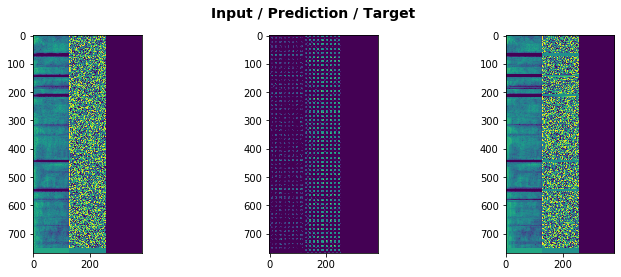

In [11]:
learn_gen.show_results(rows=1)

In [12]:
%%script false
learn_gen.lr_find()
learn_gen.recorder.plot()

Couldn't find program: 'false'


In [13]:
learn_gen.fit_one_cycle(10, max_lr=slice(1e-3,1e-1),pct_start=0.8)

epoch,train_loss,valid_loss,time
0,402.727966,0.086126,01:20
1,2.647557,0.081182,00:53
2,0.096969,0.075276,00:52
3,0.078068,0.075556,00:54
4,0.080192,0.074429,00:53
5,0.080120,0.075920,00:52
6,0.080562,0.080805,00:53
7,0.080988,0.084977,00:52
8,0.073972,0.072592,00:52
9,0.071638,0.070354,00:53


input0


prediction0


target0


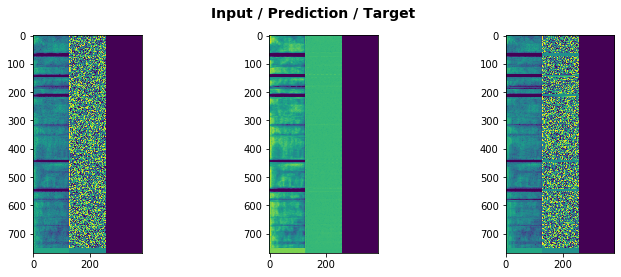

In [12]:
learn_gen.show_results(rows=1)

In [ ]:
learn_gen.save(modelname('gen_pre1'),return_path=True)

In [11]:
# learn_gen.load(latest('gen_pre1'))

search latest file of : **/gen_pre1*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:gen_pre1_005_L1Loss_20190819-214703


Learner(data=ImageDataBunch;

Train: LabelList (500 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Valid: LabelList (55 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(k

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


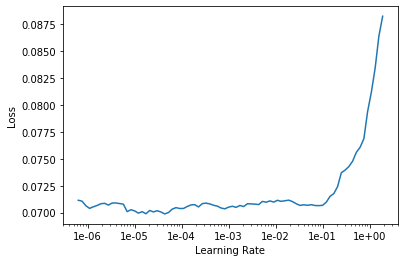

In [13]:
learn_gen.lr_find()
learn_gen.recorder.plot()

In [14]:
learn_gen.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


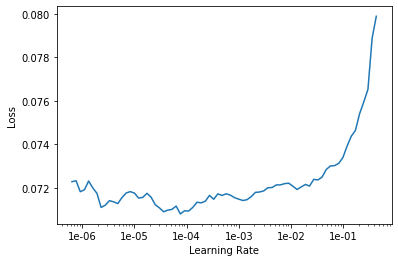

In [15]:
%%script false
learn_gen.lr_find()
learn_gen.recorder.plot()

In [16]:
learn_gen.fit_one_cycle(5, slice(1e-6,1e-3))

epoch,train_loss,valid_loss,time
0,0.070984,0.070256,00:58
1,0.071608,0.070101,00:56
2,0.071168,0.070033,00:57
3,0.071102,0.069943,00:58
4,0.070471,0.069936,01:02


input0


prediction0


target0


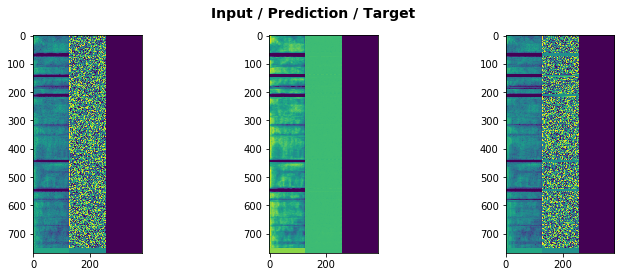

In [18]:
learn_gen.show_results(rows=1)

In [19]:
learn_gen.save(modelname('gen-pre2'),return_path=True)

WindowsPath('D:/bulk/dataset/audio/Anonymous-VC/models/gen-pre2_005_L1Loss_20190819-223000.pth')

# Save generated images

In [16]:
learn_gen.load(latest('gen-pre2'));

search latest file of : **/gen-pre2*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:gen-pre2_20190817-195016


In [20]:
def save_preds(dl):
    i=0
    names = dl.dataset.items
    
    for b in dl:
        preds = learn_gen.pred_batch(batch=b, reconstruct=True)
        for o in preds:
            o = o._px.numpy()  #Image -> Tensor -> numpy
            savepickle(path_gen/names[i].name,o[0],o[1])
            i += 1
# save_preds(data_gen.fix_dl)
save_preds(data_gen.fix_dl)

## check pickled gen_images

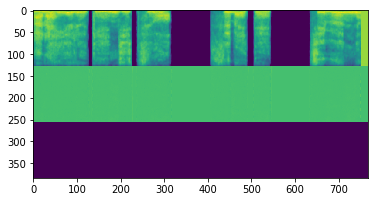

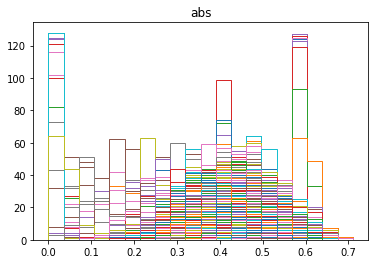

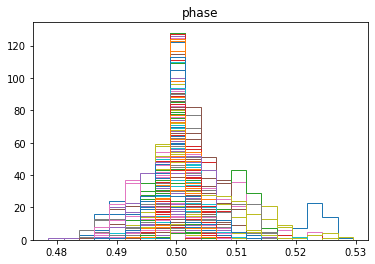

In [21]:
p = path_gen.ls()[0]
image = open_from_pickle(p)
plt.imshow(conc_specimage(image))
plt.show()
abs,phase = image_to_np(image)
display_audio(abs,phase)
save_spectrogram_asImage(abs,phase,path_gen/(p.name+"_image.png"))
hist(abs,title='abs',savepath=path_gen/(p.name+"_abs.png"))
hist(phase,title='phase',savepath=path_gen/(p.name+"_phase.png"))

# Train critic

In [11]:
learn_gen=None
gc.collect()

7

In [12]:
def get_crit_data(classes, bs):
    src = PklImageList.from_folder(path, include=classes,extensions=[".pkl"]).split_by_rand_pct(0.1, seed=42)
    ll = src.label_from_folder(classes=classes)
    data = ll.databunch(bs=bs,num_workers=0)  #.normalize(imagenet_stats)
    data.c = 3
    return data


In [13]:
bs=4  #data:3sec
wd=1e-3
data_crit = get_crit_data([path_gen.name, path_prep_original.name], bs=bs)

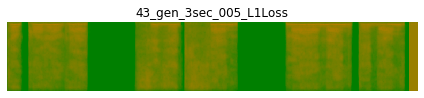

In [14]:
data_crit.show_batch(rows=1, ds_type=DatasetType.Train, imgsize=6)

In [15]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

In [16]:
def create_critic_learner(data, metrics):
    return Learner(data, gan_critic(), metrics=metrics, loss_func=loss_critic, wd=wd)


In [17]:
def my_accuracy_thresh_expand(y_pred:Tensor, y_true:Tensor, thresh:float=0.5, sigmoid:bool=True)->Rank0Tensor:
    "Compute accuracy after expanding `y_true` to the size of `y_pred`."
    if sigmoid: y_pred = y_pred.sigmoid()
    return ((y_pred>thresh).byte()==y_true[:,None].expand_as(y_pred).byte()).float().mean()

learn_crit = create_critic_learner(data_crit, my_accuracy_thresh_expand)
learn_crit.path=path

In [18]:
gc.collect()

2191

In [30]:
learn_crit.fit_one_cycle(6, 1e-3)

epoch,train_loss,valid_loss,my_accuracy_thresh_expand,time
0,0.070119,0.009416,1.000000,02:11
1,0.003494,0.000242,1.000000,02:12
2,0.000076,0.000048,1.000000,02:08
3,0.000019,0.000002,1.000000,02:17
4,0.000452,0.000013,1.000000,02:10
5,0.000018,0.000006,1.000000,02:09


In [32]:
learn_crit.save(modelname('critic-pre2'),return_path=True)

WindowsPath('D:/bulk/dataset/audio/Anonymous-VC/models/critic-pre2_005_L1Loss_20190819-224949.pth')

# train GAN

In [19]:
learn_crit=None
learn_gen=None
gc.collect()
bs=1

0

In [20]:
data_crit = get_crit_data([path_gen.name, path_prep_original.name], bs=bs)

In [21]:
learn_crit = create_critic_learner(data_crit,metrics=None).load(latest('critic-pre2'));

search latest file of : **/critic-pre2*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:critic-pre2_005_L1Loss_20190819-224949


In [22]:
learn_gen = create_gen_learner().load(latest('gen-pre2'))

search latest file of : **/gen-pre2*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:gen-pre2_005_L1Loss_20190819-223000


In [23]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.65)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,50.), show_img=False, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))
learn.path=path

In [24]:
class AudioGANTensorboardWriter(GANTensorboardWriter):
    "Broadly useful callback for Learners that writes to Tensorboard. Writes losses/metrics/"
    def on_backward_end(self, iteration:int, train:bool, **kwargs)->None:
        "override b/c self._write_model_stats(iteration=iteration) makes a error on unet model."
        return
    def on_epoch_end(self, last_metrics:MetricsList, iteration:int, **kwargs)->None:
        super().on_epoch_end(last_metrics=last_metrics,iteration=iteration, **kwargs)
        
learn.callback_fns.append(partial(AudioGANTensorboardWriter, base_dir=tboard_path
    , name='train-gan1'+'_'+datetime.now().strftime("%Y%m%d-%H%M%S")))


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


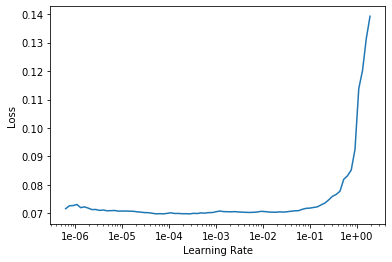

In [49]:
# %%script false
learn_gen.lr_find()
learn_gen.recorder.plot()

input0


prediction0


target0


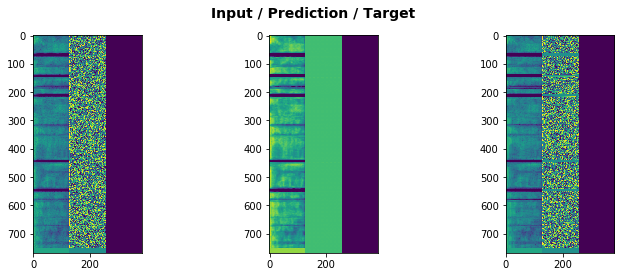

In [26]:
learn_gen.show_results(rows=1)

In [50]:
learn.save(modelname('gan1-20C1e-2'),return_path=True)

WindowsPath('D:/bulk/dataset/audio/Anonymous-VC/models/gan1-20C1e-2_005_L1Loss_20190819-235946.pth')

In [25]:
learn.load(latest('gan1'))

search latest file of : **/gan1*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:gan1-20C1e-2_005_L1Loss_20190819-235946


GANLearner(data=ImageDataBunch;

Train: LabelList (500 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Valid: LabelList (55 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Test: None, model=GANModule(
  (generator): DynamicUnet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Re

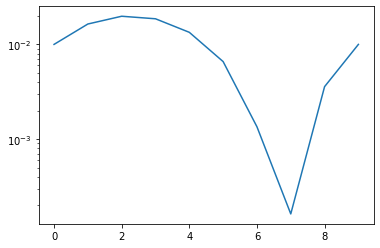

In [42]:
plt.plot(1e-2 * np.sin(np.linspace(0,2*np.pi,10))+1.001e-2)
plt.yscale('log')

In [38]:
for x in range(100000):
    for lr in (1e-2 * np.sin(np.linspace(0,2*np.pi,10))+1.001e-2):
        learn.fit(1,lr)     


epoch,train_loss,valid_loss,gen_loss,disc_loss,time


RuntimeError: CUDA out of memory. Tried to allocate 288.00 MiB (GPU 0; 8.00 GiB total capacity; 5.60 GiB already allocated; 28.05 MiB free; 628.52 MiB cached)

input0


prediction0


target0


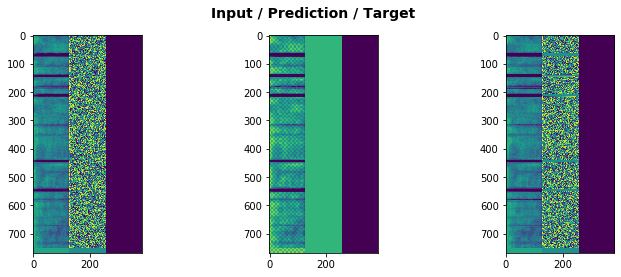

In [39]:
learn.show_results(rows=1)

In [36]:
lr = 1e-4
learn.fit(40,lr)

In [61]:
learn.save(modelname('gan1'),return_path=True)

WindowsPath('D:/bulk/dataset/audio/Anonymous-VC/33_prep_anonymous_3sec/models/gan-1c_20190818-175502.pth')

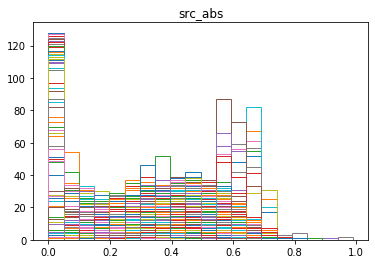

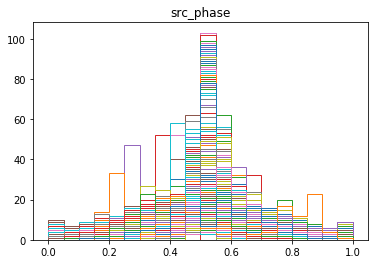

In [33]:
preds = learn_gen.pred_batch(batch=next(learn_gen.data.train_dl.__iter__()), reconstruct=True)
a,p = image_to_np(preds[1])
hist(a,'src_abs')
hist(p,'src_phase')

In [ ]:
data_gen.one_batch()[0].shape

In [ ]:
learn.data=get_data(16,192)

In [ ]:
learn.fit(10,lr/2)

In [ ]:
learn.show_results(rows=16)

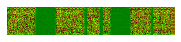

In [29]:
preds = learn_gen.pred_batch(batch=next(learn_gen.data.train_dl.__iter__()), reconstruct=True)
preds[1].show()

In [30]:
a,p = image_to_np(preds[1])
display_audio(a,p)

# postprocess

In [6]:
# check preprocessed audio
print("original")
IPython.display.display(IPython.display.Audio(p))

print("restored")
display_audio(src_abs,src_phase)

print("anonymized")
display_audio(anonymized_abs,anonymized_phase)


original


restored


anonymized


# Misc

In [26]:
learn.load(latest('gan1'))

search latest file of : **/gan1*
     from D:\bulk\dataset\audio\Anonymous-VC\models
    found:gan1_20190818-175502


GANLearner(data=ImageDataBunch;

Train: LabelList (500 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Valid: LabelList (55 items)
x: PklImageImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
y: PklImageList
Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768),Image (3, 128, 768)
Path: D:\bulk\dataset\audio\Anonymous-VC\33_prep_anonymous_3sec;

Test: None, model=GANModule(
  (generator): DynamicUnet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Re